In [1]:
import numpy as np
import librosa.display, os
import matplotlib.pyplot as plt
%matplotlib inline
 
def create_spectrogram(audio_file, image_file):
    fig = plt.figure()
    ax = fig.add_subplot(1, 1, 1)
    fig.subplots_adjust(left=0, right=1, bottom=0, top=1)
 
    y, sr = librosa.load(audio_file)
    ms = librosa.feature.melspectrogram(y=y, sr=sr)
    log_ms = librosa.power_to_db(ms, ref=np.max)
    librosa.display.specshow(log_ms, sr=sr)
 
    fig.savefig(image_file)
    plt.close(fig)
     
def create_pngs_from_wavs(input_path, output_path):
    if not os.path.exists(output_path):
        os.makedirs(output_path)
 
    dir = os.listdir(input_path)
 
    for i, file in enumerate(dir):
        input_file = os.path.join(input_path, file)
        output_file = os.path.join(output_path, file.replace('.wav', '.png'))
        create_spectrogram(input_file, output_file)

In [2]:
create_pngs_from_wavs('/kaggle/input/sounds-dataset/Sounds/background', 'Spectrograms/background')

In [3]:
create_pngs_from_wavs('/kaggle/input/sounds-dataset/Sounds/chainsaw', 'Spectrograms/chainsaw')

In [4]:
create_pngs_from_wavs('/kaggle/input/sounds-dataset/Sounds/engine', 'Spectrograms/engine')

In [5]:
create_pngs_from_wavs('/kaggle/input/sounds-dataset/Sounds/storm', 'Spectrograms/storm')

In [8]:
from tensorflow.keras.preprocessing import image

def load_images_from_path(path, label):
    images, labels = [], []

    for file in os.listdir(path):
        images.append(image.img_to_array(image.load_img(os.path.join(path, file), target_size=(224, 224, 3))))
        labels.append((label))
        
    return images, labels

def show_images(images):
    fig, axes = plt.subplots(6, 8, figsize=(20, 20), subplot_kw={'xticks': [], 'yticks': []})

    for i, ax in enumerate(axes.flat):
        ax.imshow(images[i] / 255)
        
x, y = [], []

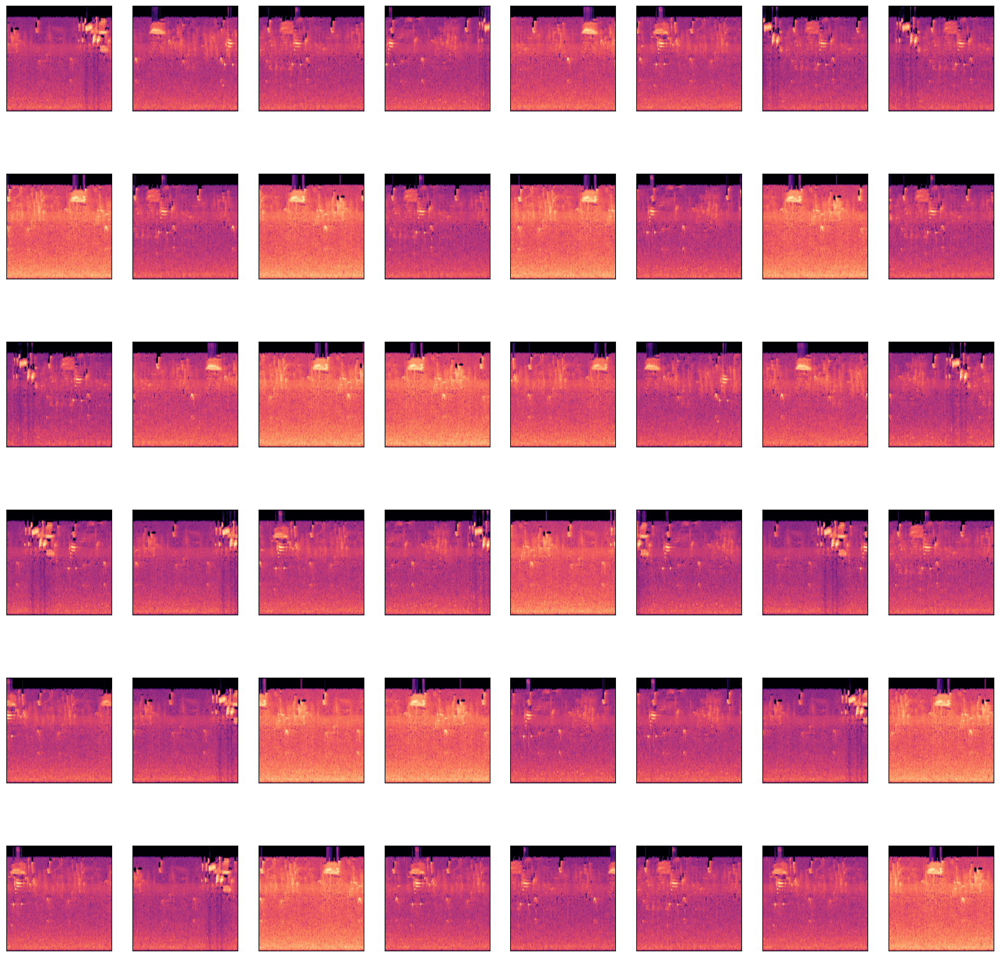

In [9]:
images, labels = load_images_from_path('Spectrograms/background', 0)
show_images(images)
    
x += images
y += labels

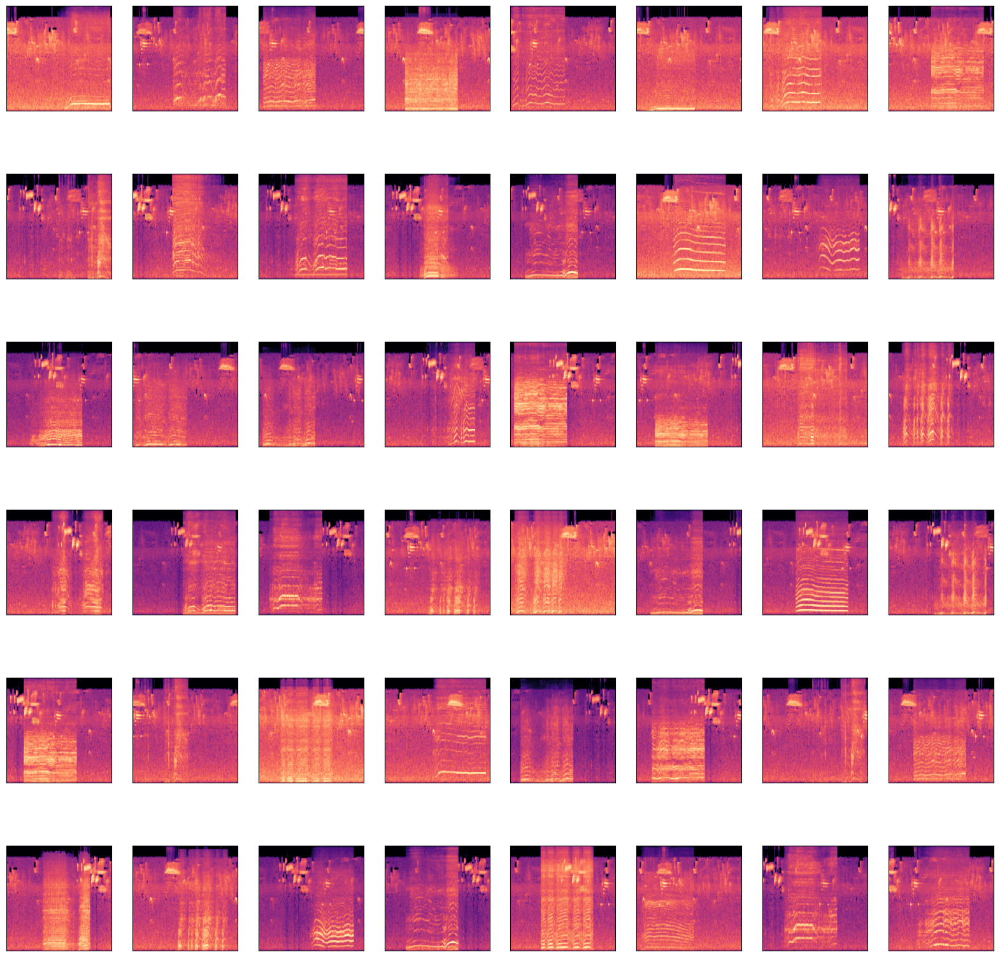

In [10]:
images, labels = load_images_from_path('Spectrograms/chainsaw', 1)
show_images(images)
    
x += images
y += labels

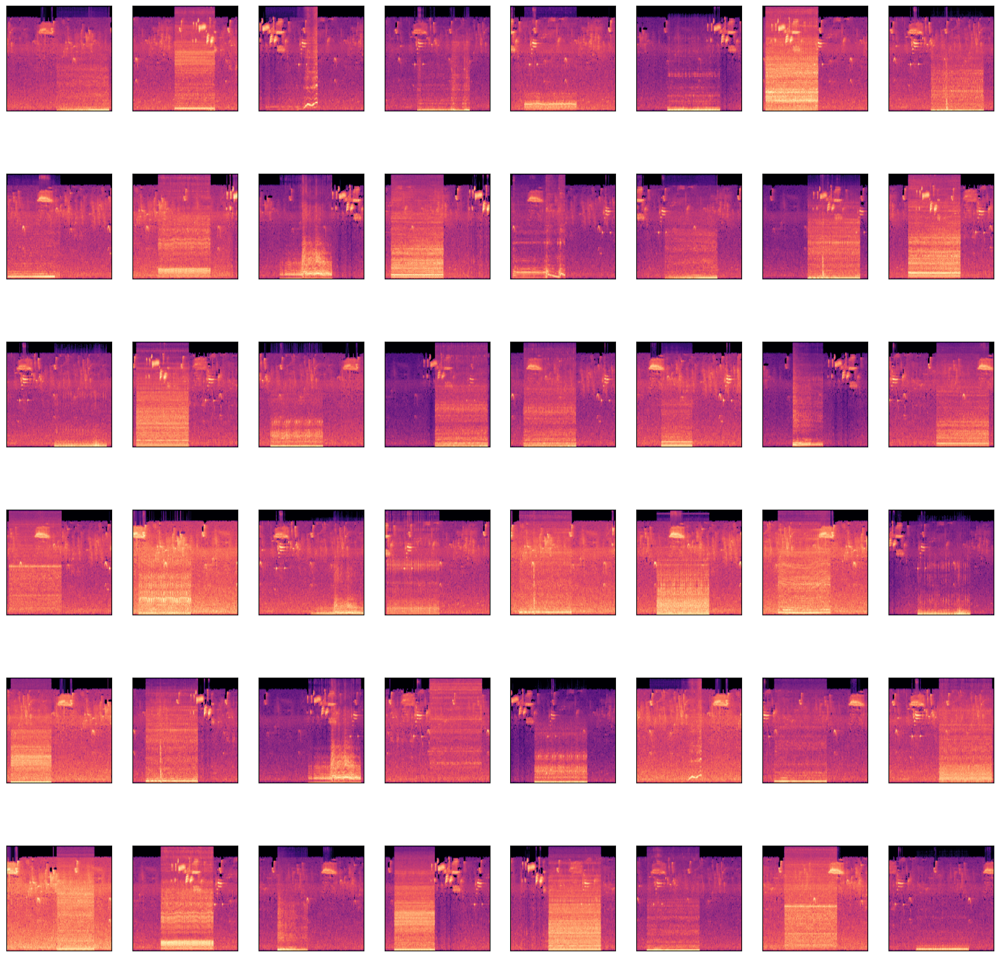

In [11]:
images, labels = load_images_from_path('Spectrograms/engine', 2)
show_images(images)
    
x += images
y += labels

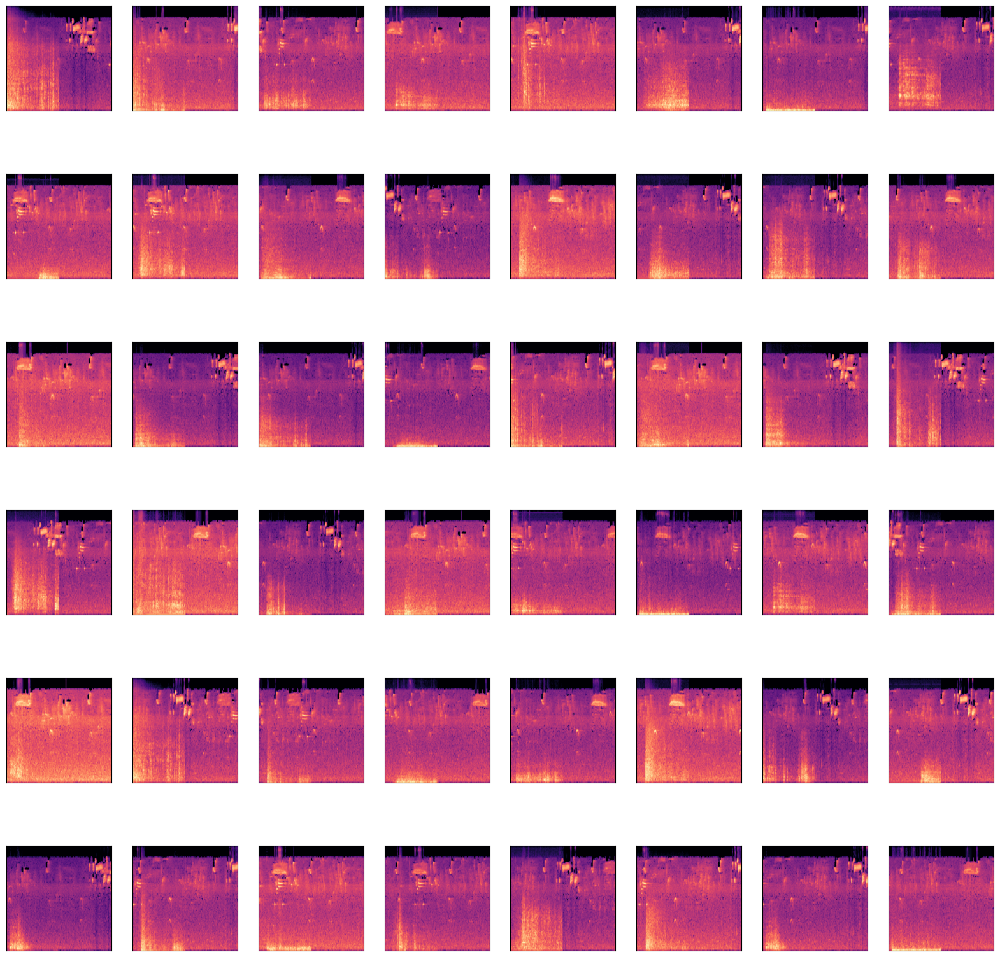

In [12]:
images, labels = load_images_from_path('Spectrograms/storm', 3)
show_images(images)
    
x += images
y += labels

In [13]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, stratify=y, test_size=0.3, random_state=0)

x_train_norm = np.array(x_train) / 255
x_test_norm = np.array(x_test) / 255

y_train = np.array(y_train)
y_test = np.array(y_test)

In [14]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense, Conv2D, MaxPooling2D

model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
model.add(MaxPooling2D(2, 2))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(2, 2))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D(2, 2))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D(2, 2))
model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dense(4, activation='softmax'))
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary(line_length=100)

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                               ┃ Output Shape                    ┃           Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                            │ (None, 222, 222, 32)            │               896 │
├────────────────────────────────────────────┼─────────────────────────────────┼───────────────────┤
│ max_pooling2d (MaxPooling2D)               │ (None, 111, 111, 32)            │                 0 │
├────────────────────────────────────────────┼─────────────────────────────────┼───────────────────┤
│ conv2d_1 (Conv2D)                          │ (None, 109, 109, 64)            │            18,496 │
├────────────────────────────────────────────┼─────────────────────────────────┼───────────────────┤
│ max_pooling2d_1 (MaxPooling2D)             │ (None, 54, 54, 64)              │                 0 │
├────────────────────────────────────────────┼─────────────────────────────────┼───────────────────┤
│ conv2d_2 (Conv2D)                          │ (None, 52, 52, 128)             │            73,856 │
├────────────────────────────────────────────┼─────────────────────────────────┼───────────────────┤
│ max_pooling2d_2 (MaxPooling2D)             │ (None, 26, 26, 128)             │                 0 │
├────────────────────────────────────────────┼─────────────────────────────────┼───────────────────┤
│ conv2d_3 (Conv2D)                          │ (None, 24, 24, 128)             │           147,584 │
├────────────────────────────────────────────┼─────────────────────────────────┼───────────────────┤
│ max_pooling2d_3 (MaxPooling2D)             │ (None, 12, 12, 128)             │                 0 │
├────────────────────────────────────────────┼─────────────────────────────────┼───────────────────┤
│ flatten (Flatten)                          │ (None, 18432)                   │                 0 │
├────────────────────────────────────────────┼─────────────────────────────────┼───────────────────┤
│ dense (Dense)                              │ (None, 1024)                    │        18,875,392 │
├────────────────────────────────────────────┼─────────────────────────────────┼───────────────────┤
│ dense_1 (Dense)                            │ (None, 4)                       │             4,100 │
└────────────────────────────────────────────┴─────────────────────────────────┴───────────────────┘

 Total params: 19,120,324 (72.94 MB)

 Trainable params: 19,120,324 (72.94 MB)

 Non-trainable params: 0 (0.00 B)

In [15]:

hist = model.fit(x_train_norm, y_train, validation_data=(x_test_norm, y_test), batch_size=10, epochs=10)

Epoch 1/10


2024-06-26 05:01:52.726645: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 11: 6.45994, expected 5.58188
2024-06-26 05:01:52.726707: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 12: 7.29622, expected 6.41816
2024-06-26 05:01:52.726716: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 28: 7.04038, expected 6.16233
2024-06-26 05:01:52.726724: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 30: 7.65045, expected 6.77239
2024-06-26 05:01:52.726732: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 63: 7.54658, expected 6.66853
2024-06-26 05:01:52.726740: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65: 7.32394, expected 6.44589
2024-06-26 05:01:52.726747: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 66: 7.37872, expected 6.50066
2024-06-26 05:01:52.726755: E external/local_xla

13/28 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.2335 - loss: 2.2985  

I0000 00:00:1719378116.723464     145 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1719378116.743212     145 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


28/28 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - accuracy: 0.2859 - loss: 1.9452 - val_accuracy: 0.4000 - val_loss: 1.0714
Epoch 2/10
 5/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.6043 - loss: 0.9762

W0000 00:00:1719378117.836860     145 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.5784 - loss: 0.9440 - val_accuracy: 0.6417 - val_loss: 0.7912
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.5907 - loss: 0.8558 - val_accuracy: 0.6167 - val_loss: 0.9138
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.6690 - loss: 0.7725 - val_accuracy: 0.5750 - val_loss: 0.8150
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.6735 - loss: 0.5794 - val_accuracy: 0.6083 - val_loss: 0.8236
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.6151 - loss: 0.7529 - val_accuracy: 0.6500 - val_loss: 0.7195
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.6897 - loss: 0.5772 - val_accuracy: 0.6250 - val_loss: 0.6703
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.7096 - loss: 0.6005 - val_accuracy: 0.6667 - val_loss: 0.7329
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.7099 - loss: 0.5348 - val_accuracy: 0.6500 - val_loss: 0.

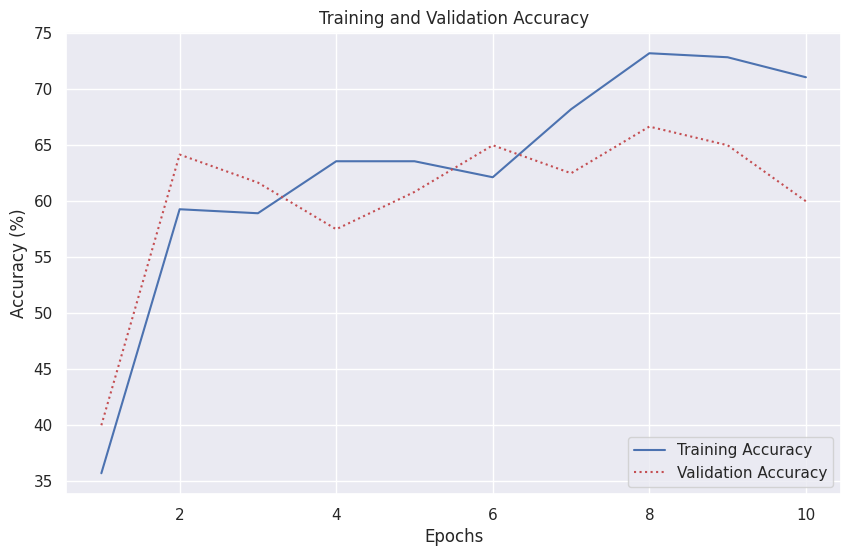

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming hist is the history object returned from model.fit
# and it contains the accuracy and validation accuracy values.
acc = [a * 100 for a in hist.history['accuracy']]
val_acc = [a * 100 for a in hist.history['val_accuracy']]
epochs = range(1, len(acc) + 1)

sns.set()  # Use seaborn's default settings for the plots

plt.figure(figsize=(10, 6))  # Optionally, set the figure size for better visibility
plt.plot(epochs, acc, 'b-', label='Training Accuracy')  # 'b-' means solid blue line
plt.plot(epochs, val_acc, 'r:', label='Validation Accuracy')  # 'r:' means dotted red line
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')  # Update y-axis label to indicate percentage
plt.legend(loc='lower right')
plt.grid(True)  # Optionally, add grid for better readability
plt.show()  # Display the plot


In [20]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet import preprocess_input

base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

x_train_norm = preprocess_input(np.array(x_train))
x_test_norm = preprocess_input(np.array(x_test))

train_features = base_model.predict(x_train_norm)
test_features = base_model.predict(x_test_norm)

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 12s 704ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


In [21]:

model = Sequential()
model.add(Flatten(input_shape=train_features.shape[1:]))
model.add(Dense(1024, activation='relu'))
model.add(Dense(4, activation='softmax'))
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

/opt/conda/lib/python3.10/site-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [22]:
hist = model.fit(train_features, y_train, validation_data=(test_features, y_test), batch_size=10, epochs=10)

Epoch 1/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.3905 - loss: 65.5939 - val_accuracy: 0.8417 - val_loss: 4.8900
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9352 - loss: 1.6348 - val_accuracy: 0.9250 - val_loss: 2.7569
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9593 - loss: 0.6026 - val_accuracy: 0.8917 - val_loss: 4.0801
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9595 - loss: 1.0088 - val_accuracy: 0.9333 - val_loss: 1.0852
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9945 - loss: 0.0501 - val_accuracy: 0.9250 - val_loss: 1.9485
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9927 - loss: 0.0484 - val_accuracy: 0.9167 - val_loss: 1.6757
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.9909 - loss: 0.0932 - val_accuracy: 0.9333 - val_loss: 2.1054
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 1.0000 - loss: 2.2099e-07 - val_accuracy: 0.933

[]

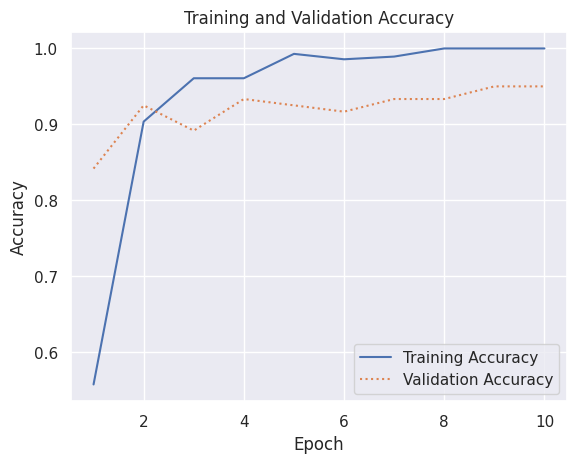

In [23]:
acc = hist.history['accuracy']
val_acc = hist.history['val_accuracy']
epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, '-', label='Training Accuracy')
plt.plot(epochs, val_acc, ':', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.plot()

1/4 ━━━━━━━━━━━━━━━━━━━━ 1s 347ms/step

W0000 00:00:1719378594.694634     145 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step


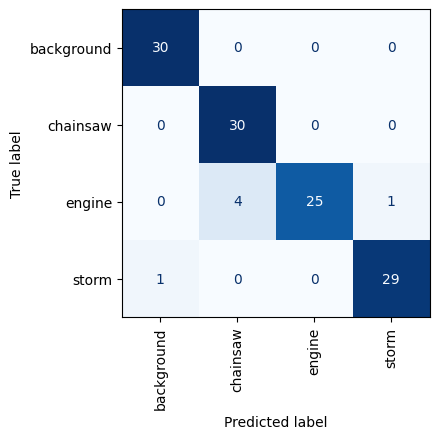

In [24]:
from sklearn.metrics import ConfusionMatrixDisplay as cmd

sns.reset_orig()
fig, ax = plt.subplots(figsize=(4, 4))
y_pred = model.predict(test_features)
class_labels = ['background', 'chainsaw', 'engine', 'storm']

cmd.from_predictions(y_test, y_pred.argmax(axis=1),
                     display_labels=class_labels, colorbar=False,
                     cmap='Blues', xticks_rotation='vertical', ax=ax)

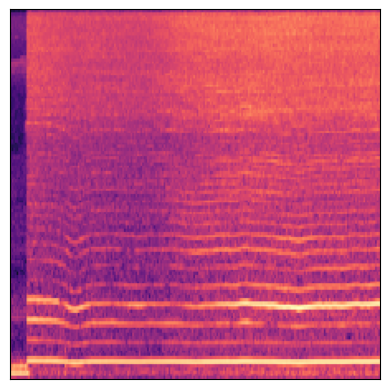

In [26]:
create_spectrogram('/kaggle/input/sounds-dataset/Sounds/samples/sample1.wav', 'Spectrograms/sample1.png')

x = image.load_img('Spectrograms/sample1.png', target_size=(224, 224))
plt.xticks([])
plt.yticks([])
plt.imshow(x)

In [27]:
x = image.img_to_array(x)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

y = base_model.predict(x)
predictions = model.predict(y)
maximum=0.0
for i, label in enumerate(class_labels):
    print(f'{label}: {predictions[0][i]}')

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
background: 0.0
chainsaw: 1.0
engine: 9.910114977848171e-23
storm: 0.0
